<a href="https://colab.research.google.com/github/ShreyPatel1311/Quantum-Computing/blob/main/Charge_State_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 2: Quantum dot charge tuning
_____



### Table of Contents

* [1. Tuning of charge state to (0,0)](#1)

    * [1.1 Import libraries and data set](#1_1)

    * [1.2. Transform the data](#1_2)

    * [1.3. Build a trainset and testset](#1_3)

    * [1.4. Build and train the CNN model](#1_4)

    * [1.5. Evaluate ML model performance](#1_5)

    * [1.6. Build a tuning routine](#1_6)
    

* [2. Exercise: Tuning of pre-defined charge state (m, n)](#2)

    * [2.1. Build a shifter function](#2_1)
    * [2.2. Build a tuning routine](#2_2)



In this notebook, we will use a Convolutional  Neural Network (CNN) to __automate a charge tuning routine of double quantum dots (DQDs)__. Using CNN, we will distinguish transition lines in Charge Stability Diagrams (CSDs). In the first part of the notebook, we will use the output of CNN to tune a DQD to the (0, 0) state. In the second part, we will use CNN to tune DQD to a specific charge state (m, n), which is left as an exercise for you!

The example of CSD without noise and with random noise is shown below:

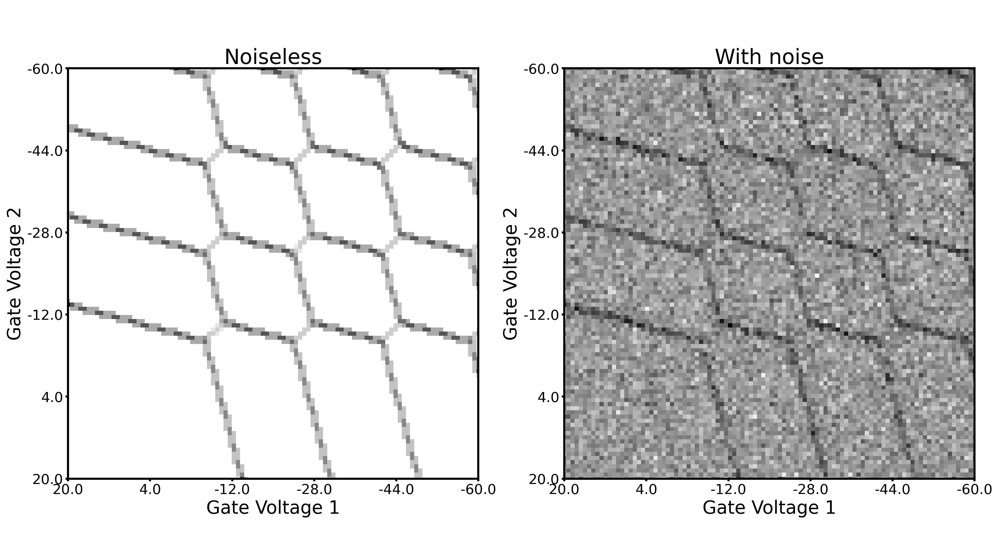

In [1]:
!git clone https://gitlab.com/QMAI/mlqe_2023_edx.git

Cloning into 'mlqe_2023_edx'...
remote: Enumerating objects: 18944, done.
remote: Counting objects: 100% (18944/18944), done.
remote: Compressing objects: 100% (9533/9533), done.
remote: Total 18944 (delta 9410), reused 18937 (delta 9408), pack-reused 0 (from 0)
Receiving objects: 100% (18944/18944), 331.14 MiB | 14.56 MiB/s, done.
Resolving deltas: 100% (9410/9410), done.
Updating files: 100% (39/39), done.


## 1. Tuning of charge state to (0,0)<a class="anchor" id="1"></a>
______

### 1.1. Import libraries and data set<a class="anchor" id="1_1"></a>

First of all, we import the libraries:

In [2]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
from PIL import Image

## Machine learning related libraries:
import torch
import torch.nn as nn                         # base class used to develop all neural network models
import torch.nn.functional as F               # module of relu activation functions
import torch.optim as optim                   # module of Adam optimizer
from tqdm.notebook import tqdm                # progress meter - wrap any iterable with tqdm(iterable)
from itertools import chain                   # append two range() functions
from torch.utils.data import DataLoader       # easy and organized data loading to the ML model
from torch.utils.data import Dataset          # for nice loadable dataset creation

## Visualization libraries:
from IPython import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity='last'

%matplotlib inline

And then import a pre-prepared dataset, allocating the __data__ (windows) of the __noisy CSD__, and __labels__:

In [3]:
with open('./mlqe_2023_edx/week2/dataset/windows.npy', 'rb') as f:
    data = np.load(f)

with open('./mlqe_2023_edx/week2/dataset/labels.txt', 'r') as f:
    labels = np.loadtxt(f, dtype = int)

print(data.shape, labels.shape)

(60000, 10, 10) (60000,)


The output shows that we have 60000 windows and labels, with a window size of 10x10 pixels.

The dataset contains 4 labels, one for each possible class of transition line in the window – no transition lines, horizontal transition line, vertical transition line, and both horizontal and vertical transition lines. Let's make a dictionary with each type of transition line for our convenience later:


In [4]:
label_dic = {0: 'none', 1: 'horizontal', 2: 'vertical', 3: 'both'}

### 1.2. Transform the data<a class="anchor" id="1_2"></a>

Here, we transform the data to __torch tensors__, in order to make them compatible with the PyTorch API:

In [5]:
## Normalize to be in range [0,1]
for i, data_norm in enumerate(data):
    data_norm = data_norm - data_norm.min()                                            # subtract the minium to get positive values
    data[i] = data_norm / data_norm.max()                                              # devide by the new maximum to get [0,1]
data_norm = data


## Transform to Tensors
data_norm, labels = torch.asarray(data_norm).float(), torch.asarray(labels).int()
print('Type of data: ', type(data_norm),', and labels: ', type(labels))                # check the type of data and labels after the transformation

data_norm = data_norm.view(data_norm.size()[0], 1,data_norm.size()[1], data_norm.size()[2])
print('New shape of data_norm: ', data_norm.size())                                    # check the shape of data and labels after the transformation

Type of data:  <class 'torch.Tensor'> , and labels:  <class 'torch.Tensor'>
New shape of data_norm:  torch.Size([60000, 1, 10, 10])


### 1.3. Build a trainset and testset<a class="anchor" id="1_3"></a>

Now, we divide the data into a trainset and a testset. We do so randomly by generating an indices list, shuffling it, and using it to assign each indices to original data for forming either the trainset or testset. To build these sets, we use the `CustomDataset()` class:

In [6]:
class CustomDataset(Dataset):
    def __init__(self, data, labels):
        # we pass data and labels when we initialize the class
        self.data = data
        self.labels = labels

    def __len__(self):
        # function that outputs length of dataset
        return len(self.data)

    def __getitem__(self, idx):
        # function that outputs data item with index idx
        # returns data, label
        data_idx = self.data[idx]
        label = self.labels[idx].type(torch.LongTensor)             # label must be output as datatype=Long (also known as int64)
        return data_idx, label

In [7]:
indices = np.arange(labels.size()[0])                               # get the indices with the lenght of data/label array
np.random.shuffle(indices)                                          # shuffle the indices

train_test_ratio = 0.8
indices_train = indices[:int(len(indices)*train_test_ratio)]        # use 80% of the dataset as trainset
indices_test = indices[int(len(indices)*train_test_ratio):]         # and the rest as testset


## Use CustomDataset to create separate trainset and testset
trainset = CustomDataset(data_norm[indices_train], labels[indices_train])
testset = CustomDataset(data_norm[indices_test], labels[indices_test])

print('Size of trainset: ', trainset.labels.size()[0], ' and testset: ', testset.labels.size()[0])    # check the size of trainset and dataset

Size of trainset:  48000  and testset:  12000


Finally, we define a batch size, and pass it with the above trainsets and testsets to the `DataLoader()` PyTorch class:

In [8]:
batch_size = 64
trainloader = DataLoader(trainset, batch_size = batch_size)
testloader = DataLoader(testset, batch_size = batch_size)

### 1.4. Build and train the CNN model<a class="anchor" id="1_4"></a>

With the datasets ready to be used in the train and test loaders, we can now define our ML model that learns to classify different transition lines.

Firstly, let's get a device that we will use for training:

In [9]:
## Get cpu or gpu device for training
device = "cuda" if torch.cuda.is_available() else "mps" if torch.has_mps else "cpu"
print(f"We are using {device} device")      # check the device we will use

We are using cpu device


<ipython-input-9-4ec465e287d9>:2: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  device = "cuda" if torch.cuda.is_available() else "mps" if torch.has_mps else "cpu"


Secondly, let's build our own neural network, layer by layer. We defining layers in the `__init__()` method, and stipulating how the data will flow through the net in the `forward()` method. Recall the convolutional network we built in the last module, and pay attention to convolutional layers' input/output dimension:

In [39]:
class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()

        self.conv_stack = nn.Sequential(
                          nn.Conv2d(in_channels = 1,
                                    out_channels = 16,
                                    kernel_size = 3,
                                    stride = 1),

                          nn.MaxPool2d(2),           # output dimension is 6x6 given 10x10 input

                          nn.Conv2d(in_channels = 16,
                                    out_channels = 32,
                                    kernel_size = 2,
                                    stride = 1),    # output dimension is 3x3
                          )

        self.flatten = nn.Flatten()
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(3 * 3 * 32 ,64)
        self.fc2 = nn.Linear(64,16)
        self.fc3 = nn.Linear(16,4)
        pass

    def forward(self, x):
        x = self.conv_stack(x)
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        logits = self.fc3(x)
        pass

        return logits

Now that the neural network is ready, we construct a model object from your `ConvNet()` class, and specify which device we will use. Here we also choose the optimizer and a loss function:

In [40]:
model = ConvNet().to(device)
loss_fn = nn.CrossEntropyLoss()                                # we use Cross Entropy as loss
optimizer = torch.optim.SGD(model.parameters(), lr=5e-2)       # The optimizer is stochastic gradient descent

Finally, we build a training and a testing function, both returning values of loss and accuracy:

In [41]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        ## Compute prediction error
        pred = model(X)
        loss = loss_fn(pred, y)                                               # increment the test loss and the correct rate

        ## Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 100==0:
            loss, current = loss.item(), batch*len(X)
            print(f"loss: {loss:>7f} [{current:>5d}/{size:>5d}]")

    correct = 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)                                 # assign input and output to the device
            pred = model(X)                                                   # use the model to make a prediction
            correct += (pred.argmax(1)==y).type(torch.float).sum().item()     # increment the correct rate
    correct /= size

    return loss, correct*100

Now, we build a testing function. Here, we define the steps to assign input and output to the device, and use the model to make a prediction and increment the test loss and the correct rate:

In [42]:
def test(dataloader,model,loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1)==y).type(torch.float).sum().item()
            pass

    test_loss /= num_batches
    correct /= size
    print(f"Test Error: \n Accuracy {(100*correct):>0.1f}%, Avg loss:{test_loss:>8f}\n")
    return test_loss, 100*correct

Then, we iterate through a number of epochs, call the training and testing function at each step, and save values of loss and accuracy to be plotted in sequence:

In [43]:
epochs = 20

## Initialize train/test accuracy/loss arrays
train_losses = np.zeros(epochs)
train_accuracies = np.zeros(epochs)

test_accuracies = np.zeros(epochs)
test_losses = np.zeros(epochs)

## Train
for t in tqdm(range(epochs)):
    print(f"Epoch {t+1}\n -------------------")
    train_losses[t], train_accuracies[t]= train(trainloader, model,loss_fn, optimizer)
    test_losses[t], test_accuracies[t] = test(testloader, model, loss_fn)
print("Done!")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1
 -------------------
loss: 1.362198 [    0/48000]
loss: 1.380447 [ 6400/48000]
loss: 1.381056 [12800/48000]
loss: 1.387779 [19200/48000]
loss: 1.355839 [25600/48000]
loss: 1.309578 [32000/48000]
loss: 1.259248 [38400/48000]
loss: 1.350778 [44800/48000]
Test Error: 
 Accuracy 43.2%, Avg loss:1.211124

Epoch 2
 -------------------
loss: 1.289247 [    0/48000]
loss: 1.107200 [ 6400/48000]
loss: 1.170755 [12800/48000]
loss: 1.195647 [19200/48000]
loss: 1.113963 [25600/48000]
loss: 1.076044 [32000/48000]
loss: 1.091897 [38400/48000]
loss: 1.008028 [44800/48000]
Test Error: 
 Accuracy 62.3%, Avg loss:0.917650

Epoch 3
 -------------------
loss: 1.029861 [    0/48000]
loss: 0.879606 [ 6400/48000]
loss: 0.765955 [12800/48000]
loss: 0.658877 [19200/48000]
loss: 0.794680 [25600/48000]
loss: 0.444690 [32000/48000]
loss: 0.711241 [38400/48000]
loss: 0.522844 [44800/48000]
Test Error: 
 Accuracy 76.9%, Avg loss:0.580904

Epoch 4
 -------------------
loss: 0.654013 [    0/48000]
loss: 0.5008

Let's plot the resulting accuracy and loss as a function of the epoch number to analyze how our model is performing:

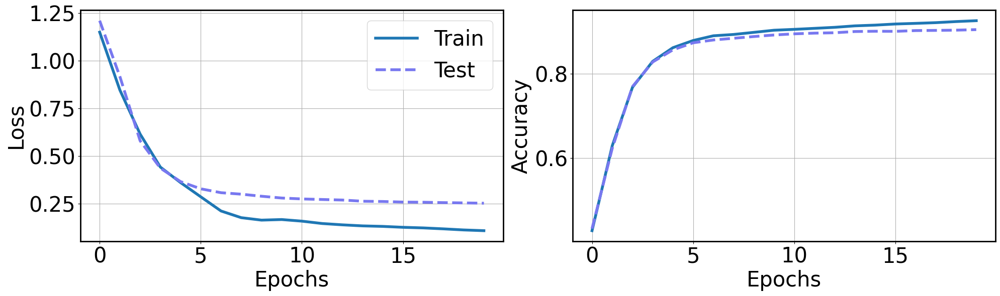

In [44]:
fig, axs = plt.subplots(1,2, figsize = (20,6))

axs[0].plot(train_losses, label = 'Train', lw = 4)
axs[0].plot(test_losses, label = 'Test',lw = 4, c = (120/255,120/255,240/255), ls = 'dashed')
axs[0].set_xlabel('Epochs', fontsize = 30)
axs[0].set_ylabel('Loss', fontsize = 30)
axs[0].legend(fontsize = 30)

axs[1].plot(train_accuracies/100, label = 'Train', lw = 4)
axs[1].plot(test_accuracies/100, label = 'Test', lw = 4, c = (120/255,120/255,240/255), ls = 'dashed')
axs[1].set_ylabel('Accuracy', fontsize = 30)
axs[1].set_xlabel('Epochs', fontsize = 30)

for i in range(2):
    axs[i].tick_params(axis='both', which='major', labelsize=30)
    axs[i].grid()
    for axis in ['top','bottom','left','right']:
        axs[i].spines[axis].set_linewidth(2)

plt.tight_layout()

### 1.5. Evaluate ML model performance<a class="anchor" id="1_5"></a>

Now that we have a CNN model that classifies transition lines, we can evaluate it on a new simulated charge stability diagrams.

We designed a CSD simulator, which allows us to access full information on the CSD, e.g. charge state for all the voltages. Let's use the pre-simulated CSD to sample new windows from it:



In [48]:
from mlqe_2023_edx.week2 import QDotSimulator
import importlib
importlib.reload(QDotSimulator)

<module 'mlqe_2023_edx.week2.QDotSimulator' from '/content/mlqe_2023_edx/week2/QDotSimulator.py'>

Then we create a csd object from our `DoubleDot()` class, import a random pre-simulated CSD, and sample a random window from it:

In [49]:
csd = QDotSimulator.DoubleDot()
random_diagram_index = np.random.randint(4)

dcharge = np.load(f'./mlqe_2023_edx/week2/dataset/simulated_csds/simulated_csd_{random_diagram_index}_dcharge.npy')

dcharge_noisy = np.load(f'./mlqe_2023_edx/week2/dataset/simulated_csds/simulated_csd_{random_diagram_index}_dcharge_noisy.npy')

charge_state = np.load(f'./mlqe_2023_edx/week2/dataset/simulated_csds/simulated_csd_{random_diagram_index}_occupation.npy')

Let's use these arrays to import a CSD, sample a random window and see where it is located in the CSD:

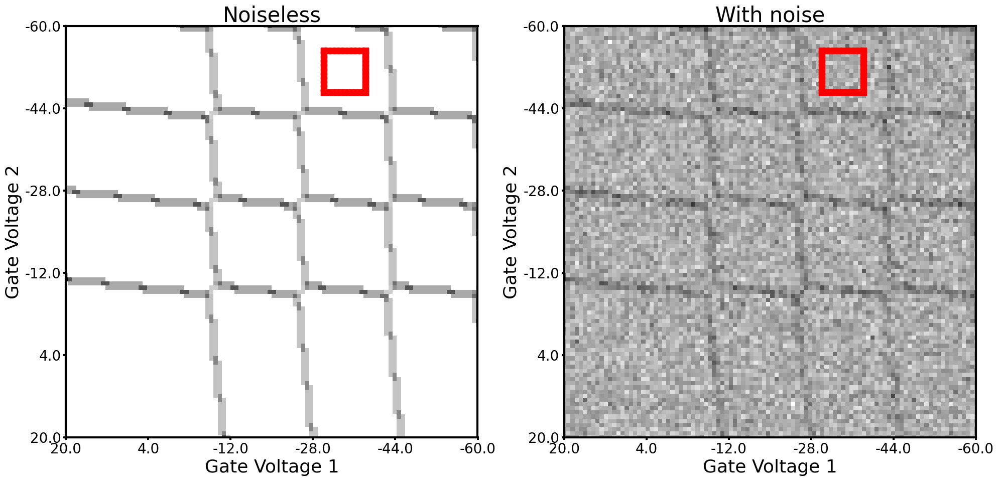

In [50]:
csd.import_csd(dcharge = dcharge, dcharge_noisy = dcharge_noisy)
csd.sample_window()
csd.plot_csd(with_window = True, show = True)

Finally, we can use our already-trained model to classify the sampled window for __noisy data__, and check if our model gets it right.

For this to work, we have to apply some transformations to the window array. Here, we have to expand the one-window sample to a 1-dimensional batch:

In [51]:
def transform_window(window):
    x = np.copy(window)
    x -= x.min()
    x /= x.max()
    x = x.reshape(1,1, x.shape[0], x.shape[1])
    x = torch.asarray(x).float().to(device)
    return x

Then, we can get the class predicted by the model when using the transformed window for noisy data as input:

In [52]:
x = transform_window(csd.window)
model.eval()
pred = model(x).argmax(1).item()

This gives the model prediction as:

In [53]:
print(pred)

0


Or, using our label dictionary:

In [54]:
label_dic[pred]

'none'

Let's check if our model classifies noisy windows (right image) correctly for multiple times, and compare them with corresponding noiseless windows (left image):

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

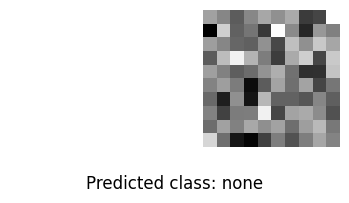

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

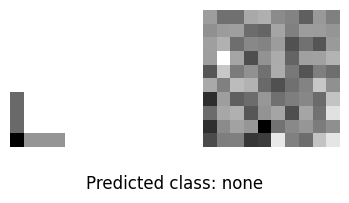

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: vertical')

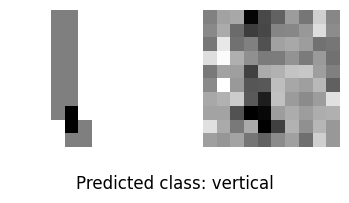

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

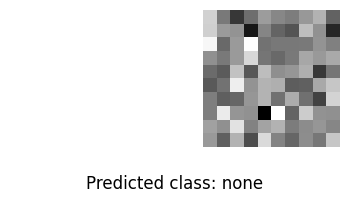

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: vertical')

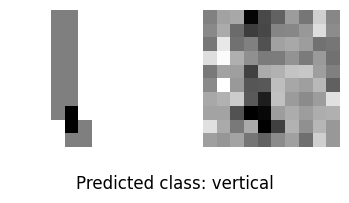

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

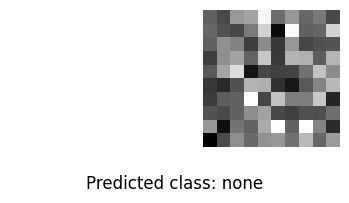

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

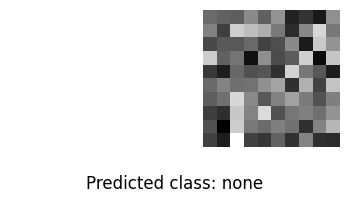

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

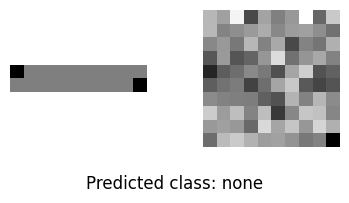

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: vertical')

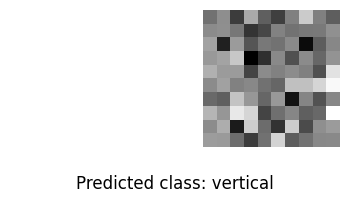

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: vertical')

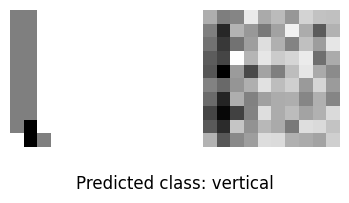

In [55]:
for _ in range(10):
    csd.sample_window()
    fig, axs = plt.subplots(1,2, figsize = (4,2))
    axs[0].imshow(csd.window_noiseless[::-1], cmap = 'binary')
    axs[1].imshow(csd.window[::-1], cmap = 'binary')
    axs[0].axis('off')
    axs[1].axis('off')
    pred = model(transform_window(csd.window[::-1]))
    fig.supxlabel('Predicted class: ' + str(label_dic[pred.argmax(1).item()]))
    plt.tight_layout()
    plt.show()
    plt.close()
    print('\n\n\n')

Notice how noisy the right images are! It would be very difficult to classify them with naked eye.

From these images above, can you notice which transition class is more likely to be misclassified? This will be important to evaluate the performance of our model later.

### 1.6. Build a tuning routine<a class="anchor" id="1_6"></a>

Let's now use the trained model, iteratively, to shift our window depending on the predicted transition class, and drive the DQD system to the charge state (0,0) from a random position on the CSD.

For this, we need to implement a __shifter function__ – the function that takes the model prediction as input and returns how the voltages have to be tuned until it reaches the desired charge state (0, 0) after certain number of steps:

In [56]:
def shifter(line, xmin, ymin, how_many_nones, how_many_stuck):
    xmin0 = xmin                                              # save initial value of xmin and ymin, to compare them to the end values, and if
    ymin0 = ymin                                              # it doesn't change for a while (how_many_stuck) stop the tuning routine
    ymin0 = ymin
    deltaV = 10                                               # define by how many pixel the window will be shifted

    horizontal_possible = True if ymin-deltaV > 0 else False  # save variables that will allow horizontal and vertical shifts, just if they will not go out of the diagram
    vertical_possible = True if xmin-deltaV > 0 else False

    if line == 'none':
        how_many_nones += 1                                   # increment how many times the net classifies the window as having no line
        if horizontal_possible: ymin -= deltaV                # just tune the y-voltage if it's not going out of the diagram
        if vertical_possible: xmin -= deltaV                  # same for x voltage

    elif line == 'horizontal' and horizontal_possible:        # repeat the process for having horizontal line
        how_many_nones = 0
        ymin -= deltaV                                        # only tune the y-voltage
        pass

    elif line == 'vertical' and vertical_possible:            # repeat the process for having vertical line
        how_many_nones = 0
        xmin -= deltaV                                        # only tune the x-voltage
        pass

    elif line == 'both':                                      # repeat the process for having both horizontal and vertical line
        how_many_nones = 0
        if horizontal_possible: ymin -= deltaV                # tune both x-voltage and y-voltage
        if vertical_possible: xmin -= deltaV
        pass

    if xmin0 == xmin and ymin == ymin0:                       # if the initial pixel position didn't change, increment how_many_stuck by 1
        how_many_stuck += 1

    return xmin, ymin, how_many_nones, how_many_stuck


Here, we build a tuning loop that iterates until the model converges to what it classifies as the (0,0) state. At each iteration, we classify the current window, and call the shifter function based on the classification result. Then we visualize the autotuning with GIF:

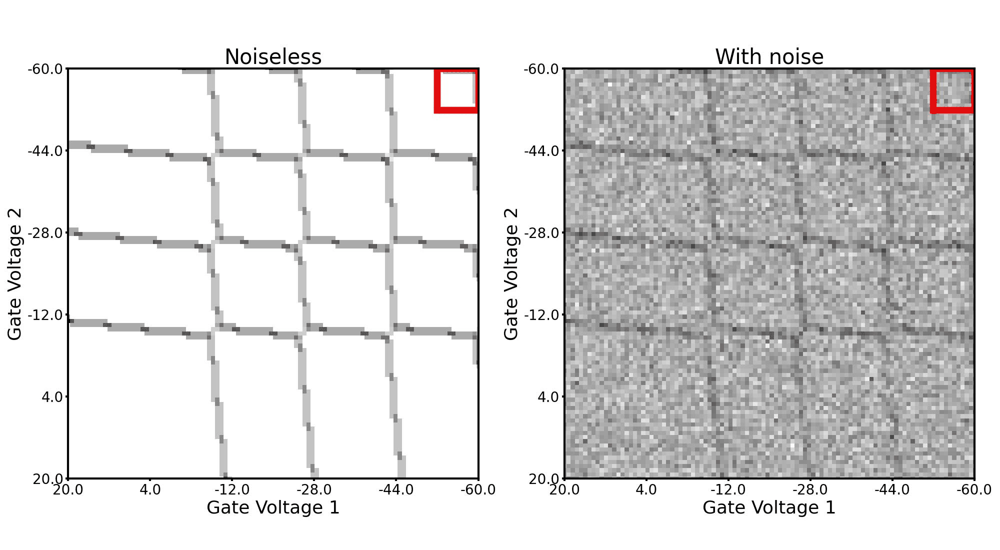

In [57]:
csd.window_xmin = np.random.randint(30,90)           # randomly sample a position for left corner of the window
csd.window_ymin = np.random.randint(30,90)

csd.sample_window(random = False)                    # sample the window and plot the diagram with it
csd.plot_csd(with_window = True, show = False)

how_many_nones = 0                                   # variable used as criteria to stop the tuner when goal is achieved
how_many_stuck = 0                                   # variable used as criteria to stop if the window cannot move anymore
                                                     # (because it would go out the diagram, for example)

steps_to_achieve_00 = 0                              # initialize how many steps are necesssary to achieve the goal
csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/00tuner_{steps_to_achieve_00}.jpg') # save the first diagram (with window) image


while how_many_nones < 3:                            # stop the tuner if a window is classified as 'none' three times
    model.eval()
    line = label_dic[model(transform_window(csd.window)).argmax(1).item()]
    csd.window_xmin, csd.window_ymin, how_many_nones, how_many_stuck = shifter(line, csd.window_xmin, csd.window_ymin, how_many_nones, how_many_stuck)

    csd.sample_window(random = False)                # sample a new window
    csd.plot_csd(with_window = True, show = False)   # plot the CSD with the new sampled window
    steps_to_achieve_00 += 1                         # increment the number of steps
    if how_many_stuck > 3: break                     # stop if the tuner is stuck more than three times
    csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/00tuner_{steps_to_achieve_00}.jpg')


## Make a GIF to visualize the progress of the autotuner
frames = []
for step in range(steps_to_achieve_00+1):
    frames.append(Image.open(f"./mlqe_2023_edx/week2/tuner_figs/00tuner_{step}.jpg"))
frame_one = frames[0]
frame_one.save(f"./mlqe_2023_edx/week2/tuner_figs/00_autotuner.gif", format="GIF", append_images=frames,
            save_all=True, duration=1000, loop=0)

with open('./mlqe_2023_edx/week2/tuner_figs/00_autotuner.gif', 'rb') as f:
  display.Image(data = f.read(), format = 'png')

## 2. Exercise: Tuning of pre-defined charge state (m, n) <a class="anchor" id="2"></a>
______

In the previous part, we used CNN to find the charge state of (0, 0) from a given position in the CSD. In this exercise problem, we will again use CNN but we will implement the "inverse" problem: starting from (0, 0), change voltages until it converges to a __specific charge state__.


### 2.1. Build a shifter function<a class="anchor" id="2_1"></a>


We need to incorporate our new shifter function that shifts the window depending on how many times we crossed horizontal and vertical lines, given the current charge state (m, n):
- If a __horizontal__ line was crossed, (m, n) -> __(m+1, n)__, and we shift the window vertically (increasing just Vy);
- if a __vertical__ line was crossed, (m, n) -> __(m, n+1)__, and we just increase the value of Vx;
- if __both__ lines were crosses, (m, n) -> __(m+1, n+1)__, and the window is shifted diagonally, incrementing both Vx and Vy.
- If __no line__ is in the window, our shift depends on our current state and the state we want to achieve.


As a first exercise, let's write a shifter function using the above-mentioned points, taking an example from the shifter function from the first part of the notebook. Specifically, write the code for window shifting for __horizontal__ lines, __vertical__ lines, and __both__ lines inside the function:

In [78]:
def specific_charge_shifter(line, xmin, ymin, current_state, final_state, how_many_stuck):

    deltaV = 10
    xmin0, ymin0 = xmin, ymin
    if line == 'none':
        if current_state[0] < final_state[0]: ymin += deltaV
        if current_state[1] < final_state[1]: xmin += deltaV

    ### YOUR CODE HERE ###
    elif line == 'horizontal':
        ymin += deltaV

    elif line == 'vertical':
        xmin += deltaV

    elif line == 'both':
        xmin += deltaV
        ymin += deltaV

    if xmin0 == xmin and ymin0 == ymin: how_many_stuck += 1

    pass

    return xmin, ymin, current_state, how_many_stuck


### 2.2. Build a tuning loop<a class="anchor" id="2_2"></a>

As a next exercise, define a tuning loop that classify a current sampled window, similar to the tuning loop from the first part.

Firstly, let's define a desired final charge state:

In [79]:
final_state = np.array([1, 1])

And sample a random initial position for our window in (0,0):

In [80]:
xmin00, ymin00 = np.random.randint(20), np.random.randint(20)

Finally, let's build a tuning loop using the final charge state and the initial position, and then visualize the autotuning using GIF:

vertical
none
both
vertical
none
vertical
horizontal
none
vertical


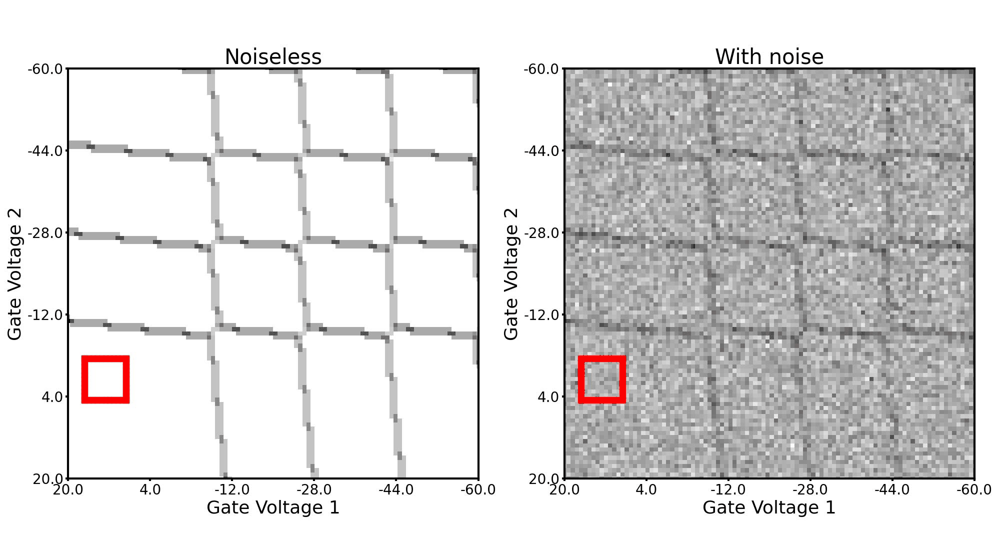

In [81]:
steps_to_final_state = 0                            # we initialize with 0 the number of steps iterate over until final state is achieved
current_state = np.zeros(2)                         # we initialize a current_state array with (0,0)
csd.window_xmin, csd.window_ymin = xmin00, ymin00   # we define in our csd object where we want our first window
csd.sample_window(random = False)                   # sample a first window
csd.plot_csd(with_window = True, show = False)      # and plot the CSD with the window
how_many_stuck = 0                                  # we intialize to 0 the number of iterations the tuner is stuck
csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/specific_charge_shifter{steps_to_final_state}.jpg')


while any(current_state != final_state):
    steps_to_final_state += 1
    model.eval()
    pred = model(transform_window(csd.window)).argmax(1).item()
    line = label_dic[pred]
    print(line)
    csd.window_xmin, csd.window_ymin, current_state, how_many_stuck = specific_charge_shifter(line, csd.window_xmin, csd.window_ymin, current_state, final_state, how_many_stuck)

    if how_many_stuck > 3 or steps_to_final_state > 8 or csd.window_xmin >= 90 or csd.window_xmin >= 90:
      steps_to_final_state -= 1
      break
    csd.sample_window(random = False)
    csd.plot_csd(with_window = True, show = False)
    csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/specific_charge_shifter{steps_to_final_state}.jpg')


## Make a GIF to visualize the progress of the autotuner
frames = []
for step in range(steps_to_final_state+1):
    frames.append(Image.open(f"./mlqe_2023_edx/week2/tuner_figs/specific_charge_shifter{step}.jpg"))
frame_one = frames[0]
frame_one.save(f"./mlqe_2023_edx/week2/tuner_figs/specific_charge_autotuner.gif", format="GIF", append_images=frames,
            save_all=True, duration=1000, loop=0)

with open('./mlqe_2023_edx/week2/tuner_figs/specific_charge_autotuner.gif', 'rb') as f:
  display.Image(data = f.read(), format = 'png')

Questions to consider: How is your autotuner performing? Can you improve the performance by changing the code? Consider changing your CNN, optimizer, shifter function or tuning loop for example.